# Remove background

Input a set of images with a mask[0,255] saved in the last channel like this
https://www.dummies.com/software/adobe/photoshop/how-to-save-a-selection-as-an-alpha-channel-in-photoshop-cs6/

Necessary libraries (for saliency):
* opencv-python
* opencv-contrib-python
for Moran's I:
* pysal

for plotting and tables:
* matplotlib
* pandas

In [1]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import time
#import matplotlib.image as mpimg

In [2]:
start_directory=r'H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\Saliency\Collection\crop\with alpha sky mask'
out_directory=r'H:\Il mio Drive\EPFL\_RESEARCH\CRENAU\Photos\Saliency\Collection\crop\with edited background'
resampling_width=800 #with horizontal layout image

In [3]:
directory=os.path.join(start_directory)
imfiles={}
for filename in os.listdir(directory):
    if filename.endswith('.jpf'):# or filename.endswith('.jpf'):
        imfiles[filename]=os.path.join(directory,filename)

<ipython-input-4-fe885a3556d2>:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(20, 6))


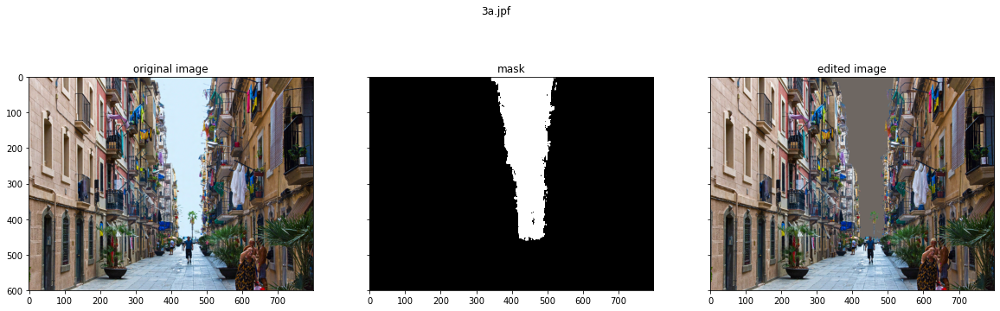

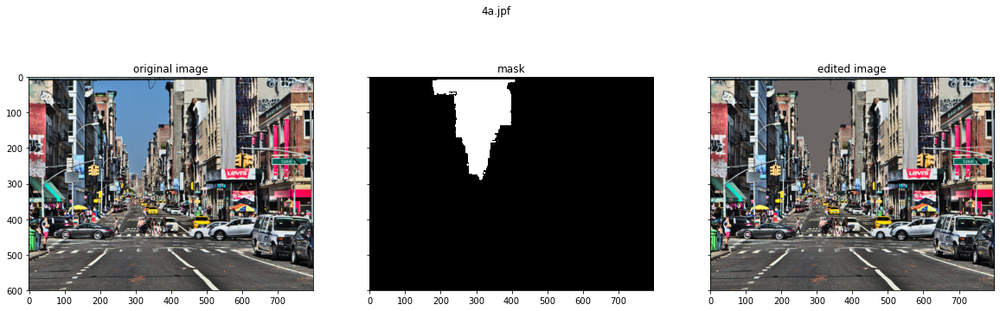

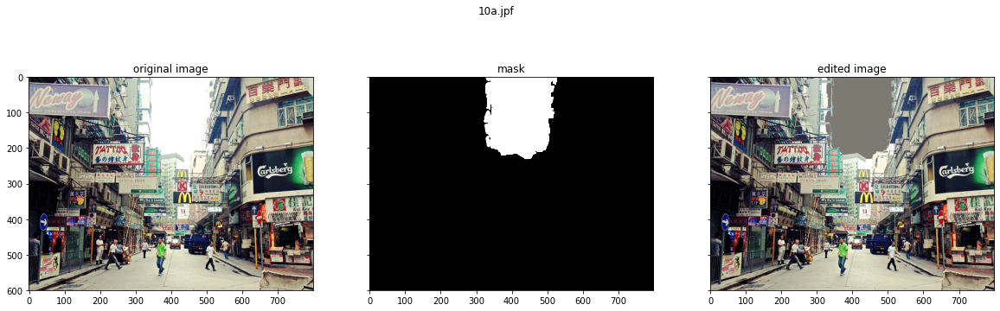

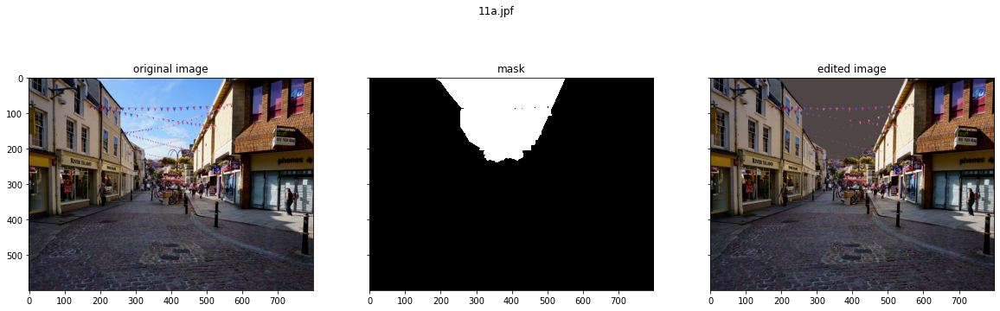

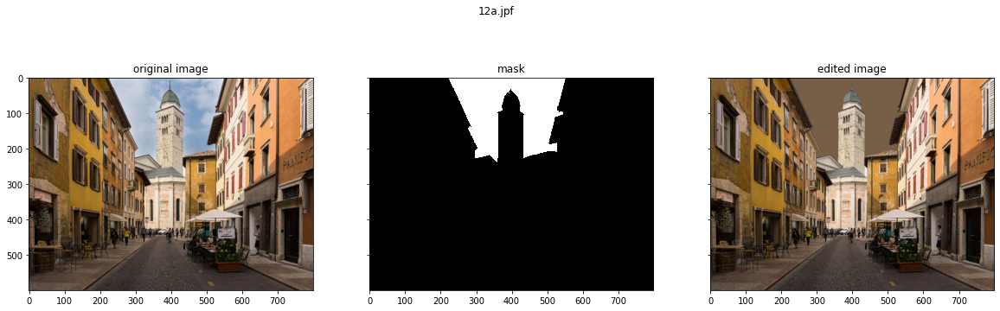

...

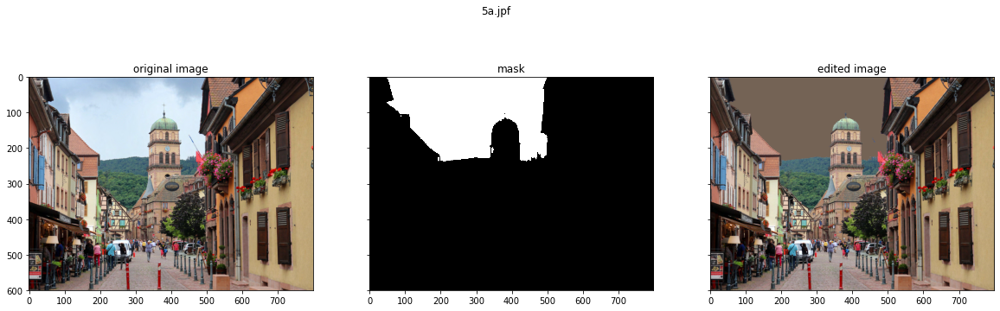

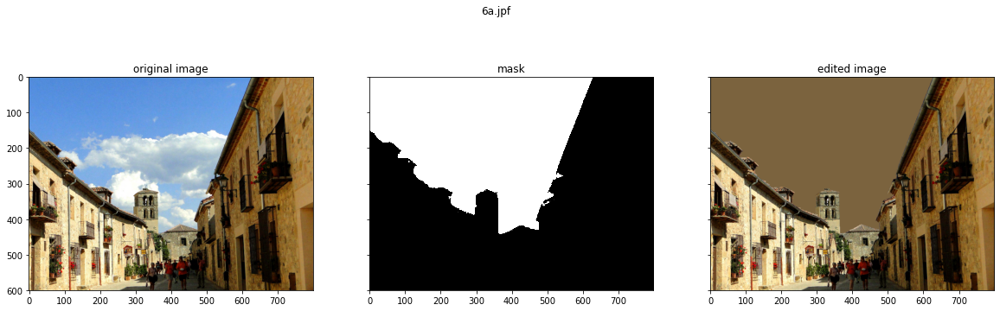

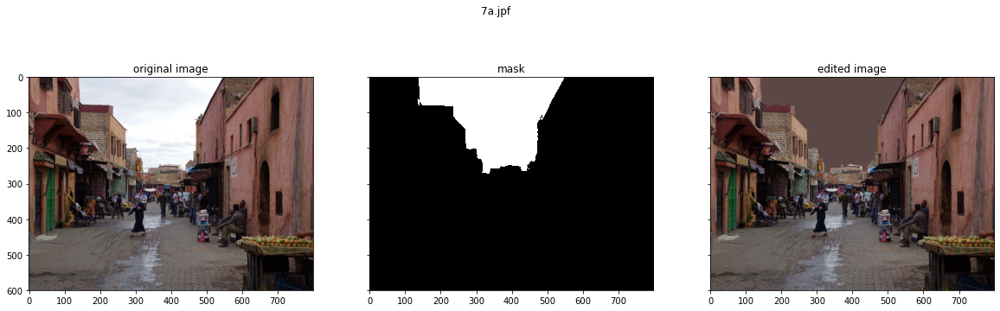

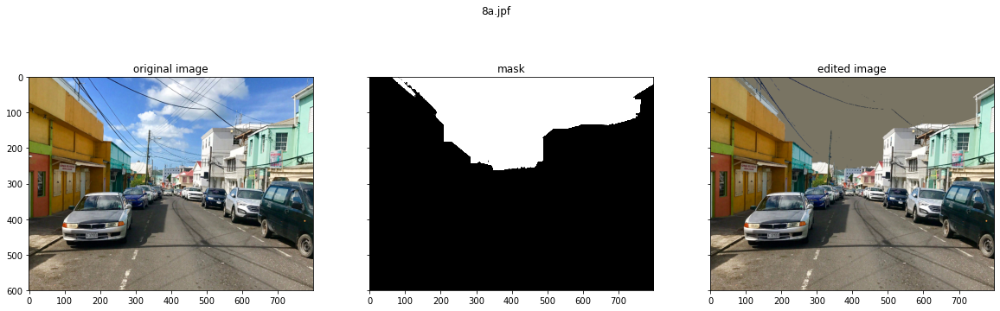

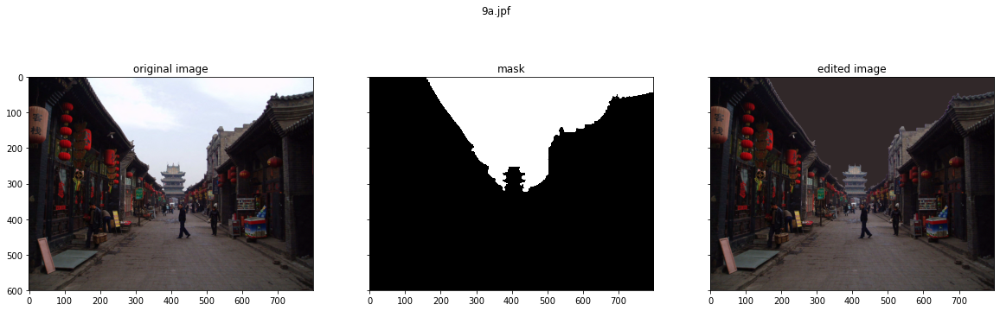

In [4]:
for filename,imfile in imfiles.items():
    image=cv2.imread(imfile,cv2.IMREAD_UNCHANGED)
    
    #rescale factor
    if image.shape[1]>=resampling_width:
        rf=resampling_width/image.shape[1]
    else:
        rf=image.shape[1]/resampling_width
    
    #rescaled image
    image_r=cv2.resize(image,(int(image.shape[1]*rf),int(image.shape[0]*rf)))
    
    #img = mpimg.imread(image_r) # this one is to read the image file instead of the matrix
    
    mask=image_r[:,:,-1]
    
    #calculate the dominant (mean) of the unmasked image
    dominant = cv2.mean(image_r[:,:,:-1], mask=255 - mask)
    
    #replace color
    replaced = np.copy(image_r[:,:,:-1])
    replaced[mask>0] = dominant[0:-1]
    
    #visualise
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(20, 6))
    fig.suptitle(filename)
    ax1.imshow(cv2.cvtColor(image_r, cv2.COLOR_BGR2RGB))
    ax1.set_title('original image')
    ax2.imshow(mask, vmin=0, vmax=1, cmap='binary_r')
    ax2.set_title('mask')
    ax3.imshow(cv2.cvtColor(replaced, cv2.COLOR_BGR2RGB))
    ax3.set_title('edited image')
    
    #export
    cv2.imwrite(os.path.join(out_directory,filename[:-3]+'jpg'),replaced)